<a href="https://colab.research.google.com/github/paulagerv/1/blob/main/Entrega_final_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Abstract

El fútbol actualmente,es una pasión considerada negocio. El mercado de pases de jugadores transacciona grandes cantidades de dinero, y las ligas deportivas invierten tiempo y dinero en intentar predecir las mejores compras de jugadores a futuro. Este conjunto de datos contiene información validada de todos los jugadores de FIFA 22. Mediante la utilización de ésta base de datos se busca predecir las mejores compras de jugadores, y generar entonces una buena inversión.

# 1- Definición de objetivo: ¿Cómo se puede predecir el precio de un prometedor jugador?

2-Contexto comercial: Nos planteamos como hipótesis que muchos factores pueden estar afectando la variable precio, de los cuales tenemos información, como pueden ser: edad, nacionalidad, tipo de liga que actualmente esta jugando (algunas son más competitivas que otras), tipo de posición del jugador (delantero, defensor,etc), fuerza y aceleración de los mismos, reputación,movimientos de destreza, faltas cometidas,entre otras.

3-Problema Comercial: -¿Cómo se puede predecir el precio de un prometedor jugador? -¿Que variables son las más influyentes en el precio de un jugador? -¿Qué edad es preferible hacer la compra? -¿La posición que juega el jugador influye en el precio ? ¿En que países conviene invertir?

4-Contexto analítico: Se tiene un archivo csv que contiene para cada jugador: Edad, peso altura, nacionalidad, Crecimientos, potencialidad, club actual, precio, caracteristicas deportivas: mejor posicion, destreza, aceleracion y fuerza, faltas totales cometidas, entre otras



#Data Story Telling



data story telling: El fútbol actualmente,es una pasión considerada negocio. El mercado de pases de jugadores transacciona grandes cantidades de dinero, y las ligas deportivas invierten tiempo y dinero en intentar predecir las mejores compras de jugadores a futuro. Este conjunto de datos contiene información validada de todos los jugadores de FIFA 22. Mediante la utilización de ésta base de datos nos planteamos como objetivo: ¿Cómo se puede predecir el precio de un prometedor jugador?

# Base de datos: Fifa player 2022

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
df=pd.read_csv('/content/drive/MyDrive/DESAFIOS ENTREGABLES./players_fifa22.csv')
df.head(3)

,ID,Name,FullName,Age,Height,Weight,PhotoUrl,Nationality,Overall,Potential,...,LMRating,CMRating,RMRating,LWBRating,CDMRating,RWBRating,LBRating,CBRating,RBRating,GKRating
0,158023,L. Messi,Lionel Messi,34,170,72,https://cdn.sofifa.com/players/158/023/22_60.png,Argentina,93,93,...,93,90,93,69,67,69,64,53,64,22
1,188545,R. Lewandowski,Robert Lewandowski,32,185,81,https://cdn.sofifa.com/players/188/545/22_60.png,Poland,92,92,...,87,83,87,67,69,67,64,63,64,22
2,20801,Cristiano Ronaldo,C. Ronaldo dos Santos Aveiro,36,187,83,https://cdn.sofifa.com/players/020/801/22_60.png,Portugal,91,91,...,89,81,89,66,62,66,63,56,63,23


In [ ]:
print(df.columns)

Index(['ID', 'Name', 'FullName', 'Age', 'Height', 'Weight', 'PhotoUrl',
       'Nationality', 'Overall', 'Potential', 'Growth', 'TotalStats',
       'BaseStats', 'Positions', 'BestPosition', 'Club', 'ValueEUR', 'WageEUR',
       'ReleaseClause', 'ClubPosition', 'ContractUntil', 'ClubNumber',
       'ClubJoined', 'OnLoad', 'NationalTeam', 'NationalPosition',
       'NationalNumber', 'PreferredFoot', 'IntReputation', 'WeakFoot',
       'SkillMoves', 'AttackingWorkRate', 'DefensiveWorkRate', 'PaceTotal',
       'ShootingTotal', 'PassingTotal', 'DribblingTotal', 'DefendingTotal',
       'PhysicalityTotal', 'Crossing', 'Finishing', 'HeadingAccuracy',
       'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
       'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility',
       'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength',
       'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision',
       'Penalties', 'Composure', 'Marking',

In [ ]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19260 entries, 0 to 19259
Data columns (total 90 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 19260 non-null  int64  
 1   Name               19260 non-null  object 
 2   FullName           19260 non-null  object 
 3   Age                19260 non-null  int64  
 4   Height             19260 non-null  int64  
 5   Weight             19260 non-null  int64  
 6   PhotoUrl           19260 non-null  object 
 7   Nationality        19260 non-null  object 
 8   Overall            19260 non-null  int64  
 9   Potential          19260 non-null  int64  
 10  Growth             19260 non-null  int64  
 11  TotalStats         19260 non-null  int64  
 12  BaseStats          19260 non-null  int64  
 13  Positions          19260 non-null  object 
 14  BestPosition       19260 non-null  object 
 15  Club               19260 non-null  object 
 16  ValueEUR           192

In [ ]:
print(df.describe())

                  ID           Age        Height        Weight       Overall  \
count   19260.000000  19260.000000  19260.000000  19260.000000  19260.000000   
mean   231682.741952     25.184683    181.305036     74.950779     65.815628   
std     26960.272515      4.737340      6.866151      7.066864      6.817297   
min        41.000000     16.000000    155.000000     49.000000     48.000000   
25%    214903.500000     21.000000    176.000000     70.000000     62.000000   
50%    236687.500000     25.000000    181.000000     75.000000     66.000000   
75%    253607.500000     29.000000    186.000000     80.000000     70.000000   
max    264705.000000     54.000000    206.000000    110.000000     93.000000   

          Potential        Growth    TotalStats     BaseStats      ValueEUR  \
count  19260.000000  19260.000000  19260.000000  19260.000000  1.926000e+04   
mean      71.100104      5.284476   1598.525909    357.062461  2.857652e+06   
std        6.092103      5.472201    271.5

In [ ]:
df.count()

ID           19260
Name         19260
FullName     19260
Age          19260
Height       19260
             ...  
RWBRating    19260
LBRating     19260
CBRating     19260
RBRating     19260
GKRating     19260
Length: 90, dtype: int64

In [ ]:
df.shape

(19260, 90)

# Data wrangling:
# 1-Evaluación de datos faltantes:

In [ ]:
#ver si el dataframe tiene datos nulos.
columnas_con_nulos = df.isnull().any()

# Contar el número de valores nulos en cada columna
conteo_nulos_por_columna = df.isnull().sum()

# Crear un DataFrame con la información de columnas con valores nulos
info_nulos = pd.DataFrame({'Columna': columnas_con_nulos.index,
                           'Valores Nulos': columnas_con_nulos.values,
                           'Cantidad de Nulos': conteo_nulos_por_columna.values})

# Filtrar las columnas con valores nulos
columnas_con_nulos = info_nulos[info_nulos['Valores Nulos'] == True]

# Imprimir el resultado
print(columnas_con_nulos)

             Columna  Valores Nulos  Cantidad de Nulos
19      ClubPosition           True                 76
20     ContractUntil           True                 76
21        ClubNumber           True                 76
25  NationalPosition           True              18503
26    NationalNumber           True              18503


In [ ]:
df[['NationalPosition','NationalNumber']].fillna("-", inplace=True)
df[['ClubPosition','ContractUntil','ClubNumber']].fillna("-", inplace=True)

<ipython-input-112-5ea059777f7d>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-112-5ea059777f7d>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Se observa presencia de valores nulos, esto puede ser debido a la falta de informacion de esas columnas, por otro lado no todos lso jugadores juegan en su seleccion por eso esas columnas tienen mayores valores nulos.
Ademas hay 76 valores faltantes que podrian ser de jugadores sin contrato actual es por eso que no aparece el contrato ni el club ni posicion que juegan, es decir, son jugadores libres.

# 2- Formato de las columnas

In [ ]:
print(df.dtypes)

ID            int64
Name         object
FullName     object
Age           int64
Height        int64
              ...  
RWBRating     int64
LBRating      int64
CBRating      int64
RBRating      int64
GKRating      int64
Length: 90, dtype: object


Como podemos ver arriba, algunas columnas son del tipo de datos correcto. Las variables numéricas deben tener el tipo 'float' o 'int', y las variables con texto, como las categorías, deben tener el tipo 'objeto'.

# 3-Duplicados

In [ ]:
# Calcula la cantidad de valores duplicados en la columna 'ID'
duplicates_count = df['ID'].duplicated().sum()
print("Cantidad de valores duplicados en la columna 'ID':")
print(duplicates_count)


Cantidad de valores duplicados en la columna 'ID':
104


In [ ]:
# Elimina los valores duplicados de la columna 'ID'
df = df.drop_duplicates(keep='last')

print("DataFrame sin valores duplicados en la columna 'ID':")
print(df)

DataFrame sin valores duplicados en la columna 'ID':
           ID               Name                      FullName  Age  Height  \
0      158023           L. Messi                  Lionel Messi   34     170   
1      188545     R. Lewandowski            Robert Lewandowski   32     185   
2       20801  Cristiano Ronaldo  C. Ronaldo dos Santos Aveiro   36     187   
3      231747          K. Mbappé                 Kylian Mbappé   22     182   
4      200389           J. Oblak                     Jan Oblak   28     188   
...       ...                ...                           ...  ...     ...   
19255  262759           S. Black                 Stephen Black   19     180   
19256  250978            Ma Zhen                       Zhen Ma   23     196   
19257  261985         Yang Haoyu                    Haoyu Yang   20     183   
19258  261977           He Siwei                      Siwei He   20     174   
19259  261932      Chen Guoliang                 Guoliang Chen   22     186   

Se eliminaron 104 valores duplicados de la columna ID

# 4-Analisis particular de la variable interes: outliers y datos nulos


In [ ]:
import plotly.express as px
fig = px.box(df, y='ValueEUR', title='Outliers de la variable ValueEUR')
fig.show()


Observamos muchos valores outliers por encima de la media probablemente producto de los precios elevados de muchos jugadores de gran jerarquia.

In [ ]:
import plotly.express as px
fig = px.histogram(df, x='ValueEUR', title='Histograma de la Variable ValueEUR')
fig.show()


Hay muchos valores 0 , lo cual vienieron de la variable precio del jugador , no tiene sentido, es por eso que la los vamos a detectar e imputar. como el histograma muestra una simetria negativa, imputaremos con la mediana

In [ ]:

count_of_zeros = (df['ValueEUR'] == 0).sum()

print(f"La cantidad de valores iguales a 0 en la columna 'ValueEUR' es: {count_of_zeros}")

La cantidad de valores iguales a 0 en la columna 'ValueEUR' es: 88


La columna precio en euros contiene muchos valores de precio = a 0, lo cual no es posible ni tiene sentido, para este analisis, vamos a generar un df con datos =a 0 imputados por promedio.

In [ ]:
# Obtener una copia del DataFrame
df1 = df.copy()

# Imputar los valores iguales a 0 con la mediana de 'ValueEUR'
median_value = df1[df1['ValueEUR'] != 0]['ValueEUR'].median()
df1['ValueEUR'] = df1['ValueEUR'].replace(0, median_value)

In [ ]:
count_of_zeros1=(df1['ValueEUR'] == 0).sum()

print(f"La cantidad de valores iguales a 0 en la columna 'ValueEUR' es: {count_of_zeros1}")

La cantidad de valores iguales a 0 en la columna 'ValueEUR' es: 0


In [ ]:
import plotly.express as px
fig = px.histogram(df1, x='ValueEUR', title='Histograma de la Variable ValueEUR')
fig.show()

# EDA: ANALISIS UNIVARIADO.

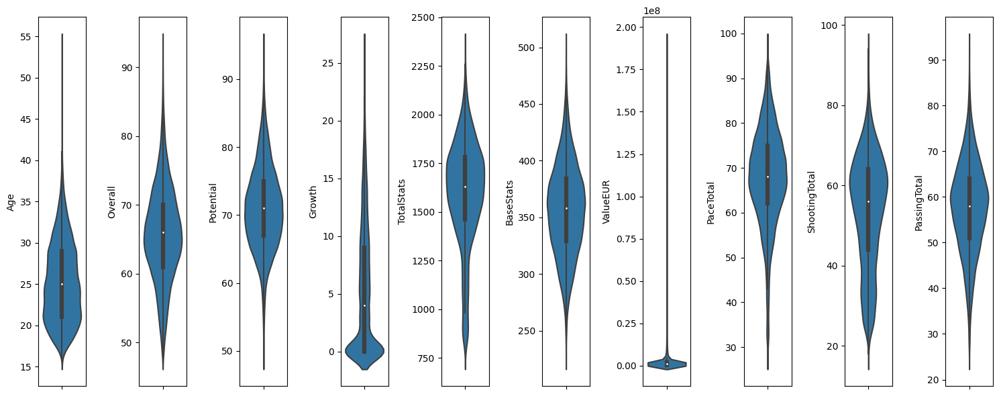

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
variables = ['Age', 'Overall','Potential','Growth','TotalStats','BaseStats','ValueEUR','PaceTotal','ShootingTotal','PassingTotal']

fig, axes = plt.subplots(1, len(variables), figsize=(15,6))
for ax, variable in zip(axes, variables):
    ax = sns.violinplot( y=variable, data=df1, ax=ax)
plt.tight_layout()

In [ ]:
pip install pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 33.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 46.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 29.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 79.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e0af5ed13df5b8ba96939112803bb077f83e92d8148d5c72d7d2037c20e18f56
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport
ProfileReport(df1, minimal=True)




<ipython-input-21-fa5aeab7e552>:2: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
import scipy.stats
import pandas as pd

# Obtener los valores de la columna "ValueEUR" del DataFrame
ValueEUR = df1['ValueEUR']

# Medidas de tendencia central
desc_stats = scipy.stats.describe(ValueEUR)
geometric_mean = scipy.stats.gmean(ValueEUR)
harmonic_mean = scipy.stats.hmean(ValueEUR)
trimmed_mean = scipy.stats.trim_mean(ValueEUR, 0.1)
mode = scipy.stats.mode(ValueEUR)

# Medidas de dispersión
coef_variation = scipy.stats.variation(ValueEUR)
iqr = scipy.stats.iqr(ValueEUR)
standard_error = scipy.stats.sem(ValueEUR)

# Medidas de asimetría y curtosis
skewness = scipy.stats.skew(ValueEUR)
kurtosis = scipy.stats.kurtosis(ValueEUR)

# Imprimir los resultados
print("Medidas de tendencia central:")
print("Descripción estadística:", desc_stats)
print("Media geométrica:", geometric_mean)
print("Media armónica:", harmonic_mean)
print("Media recortada:", trimmed_mean)
print("Moda:", mode)

print("\nMedidas de dispersión:")
print("Coeficiente de variación:", coef_variation)
print("IQR:", iqr)
print("Error estándar:", standard_error)

print("\nMedidas de asimetría y curtosis:")
print("Coeficiente de asimetría:", skewness)
print("Curtosis:", kurtosis)


Medidas de tendencia central:
Descripción estadística: DescribeResult(nobs=19156, minmax=(9000, 194000000), mean=2830255.2175819585, variance=57890438071583.12, skewness=8.201728836374853, kurtosis=98.12767101143423)
Media geométrica: 1069840.6296348344
Media armónica: 565295.853944608
Media recortada: 1288079.077906825
Moda: ModeResult(mode=1200000, count=616)

Medidas de dispersión:
Coeficiente de variación: 2.6882303644317673
IQR: 1525000.0
Error estándar: 54973.19819620985

Medidas de asimetría y curtosis:
Coeficiente de asimetría: 8.201728836374853
Curtosis: 98.12767101143423


Realizamos el analisis univariado, en particular , de nuestra variable de interes ValueEUR, previamente eliminamos  88 valores igual a 0 . Realizamos analisis de freciencias y analizamos las medidas de tendencia central. Medidas de tendencia central: La media aritmética es de aproximadamente 2,870,768.25. Esto te da una idea del valor promedio en el conjunto de datos. La media geométrica es mucho más baja, alrededor de 1,087,003.16. La diferencia entre la media aritmética y geométrica sugiere que hay valores atípicos (valores muy grandes) en los datos, lo cual se observa tambien en el grafico de puntos. La media armónica, 569,131.65, también está más baja. La diferencia entre las tres medidas de media podría indicar una distribución sesgada hacia valores más grandes. La moda es 1,200,000 y aparece 616 veces en el conjunto de datos, lo que sugiere que este valor es común y posiblemente representa un valor clave o umbral.

Medidas de dispersión: El coeficiente de variación es 2.65, lo que sugiere que la dispersión relativa (en términos de porcentaje) es moderada en relación con la media. El rango intercuartil (IQR) es grande, 1,600,000, lo que indica una dispersión significativa entre el primer y tercer cuartil.

Medidas de asimetría y curtosis: El coeficiente de asimetría es bastante alto, 8.17, indicando una distribución asimétrica hacia valores más grandes (asimetria positiva) La curtosis es 97.76, lo que sugiere que la distribución tiene colas pesadas y un pico pronunciado, lo cual se observa en el grafico de distribucion

# EDA. Análisis bivariado

In [ ]:
import pandas as pd

# Calcular la matriz de correlación
corr_matrix = df1.corr()

# Seleccionar la columna de correlaciones con 'ValueEUR'
ValueEUR_correlations = corr_matrix['ValueEUR'].abs().sort_values(ascending=False)
variables_correlated_with_valueEUR = ValueEUR_correlations.index[1:]
print("Variables correlacionadas con 'ValueEUR' (de mayor a menor):")
print(variables_correlated_with_valueEUR)

<ipython-input-56-170f8bcde449>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Variables correlacionadas con 'ValueEUR' (de mayor a menor):
Index(['ReleaseClause', 'WageEUR', 'IntReputation', 'Overall', 'Potential',
       'Reactions', 'BaseStats', 'PassingTotal', 'DribblingTotal', 'Composure',
       'TotalStats', 'Vision', 'CMRating', 'CAMRating', 'ShotPower',
       'ShortPassing', 'LMRating', 'RMRating', 'STRating', 'RFRating',
       'CFRating', 'LFRating', 'RWRating', 'LWRating', 'ShootingTotal',
       'LongPassing', 'BallControl', 'SkillMoves', 'CDMRating', 'Curve',
       'LWBRating', 'RWBRating', 'Dribbling', 'Volleys', 'PhysicalityTotal',
       'LongShots', 'RBRating', 'LBRating', 'Crossing', 'Positioning',
       'ContractUntil', 'Finishing', 'FKAccuracy', 'PaceTotal', 'Stamina',
       'CBRating', 'Penalties', 'Aggression', 'Agility', 'HeadingAccuracy',
       'SprintSpeed', 'Acceleration', 'DefendingTotal', 'WeakFoot',
       'ClubJoined', 'Interceptions', 'Marking', 'Strength', 'ID',
       'StandingTackle', 'Jumping', 'Balance', 'Growth', 'Slidin

In [ ]:
import plotly.express as px

colores_personalizados = ['#FF5733', '#3498DB', '#FFC300']

# Boxplot comparativo reputación vs precio
fig1 = px.box(df1, x='IntReputation', y='ValueEUR', title='Reputación vs precio')
fig1.update_xaxes(title='Reputación')
fig1.update_yaxes(title='Precio')
fig1.update_traces(marker=dict(color=colores_personalizados[0]))

# Boxplot comparativo puntuación general vs precio
fig2 = px.box(df1, x='Overall', y='ValueEUR', title='Puntuación general vs precio')
fig2.update_xaxes(title='Puntuación general')
fig2.update_yaxes(title='Precio')
fig2.update_traces(marker=dict(color=colores_personalizados[1]))

# Scatterplot potencia vs precio
fig3 = px.scatter(df1, x='Potential', y='ValueEUR', title='Potencia vs precio')
fig3.update_xaxes(title='Potencia')
fig3.update_yaxes(title='Precio')
fig3.update_traces(marker=dict(color=colores_personalizados[2]))

# Mostrar los gráficos
fig1.show()
fig2.show()
fig3.show()



INSIGHT 1: Las variables que más correlación tienen con nuestra variable de interes precio son: reputación, puntuacion deportiva en general, y potencia de juego. En los 3 casos a medida que aumentan estos parámetros, aumenta el precio de venta de los jugadores.

In [ ]:
import pandas as pd

# Calcular la matriz de correlación
corr_matrix = df1.corr()

# Seleccionar la columna de correlaciones con 'Age'
age_correlations = corr_matrix['Age'].abs().sort_values(ascending=False)

# Excluir la correlación con 'Age' y obtener las variables correlacionadas en orden descendente
variables_correlated_with_age = age_correlations.index[1:]  # Excluimos 'Age' de la lista

# Imprimir las variables correlacionadas con 'Age' en orden descendente
print("Variables correlacionadas con 'Edad' (de mayor a menor):")
print(variables_correlated_with_age)

<ipython-input-40-a780c647b39a>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Variables correlacionadas con 'Edad' (de mayor a menor):
Index(['Growth', 'ID', 'Overall', 'Reactions', 'PhysicalityTotal', 'BaseStats',
       'Composure', 'PassingTotal', 'Strength', 'ShotPower', 'Potential',
       'ShootingTotal', 'TotalStats', 'Aggression', 'Weight', 'IntReputation',
       'DefendingTotal', 'ContractUntil', 'Jumping', 'ClubNumber',
       'DribblingTotal', 'Vision', 'ClubJoined', 'NationalNumber', 'CDMRating',
       'FKAccuracy', 'LongPassing', 'CBRating', 'Interceptions', 'CMRating',
       'Marking', 'LongShots', 'PaceTotal', 'WageEUR', 'HeadingAccuracy',
       'Acceleration', 'Penalties', 'Curve', 'Volleys', 'SprintSpeed',
       'ShortPassing', 'GKRating', 'RBRating', 'LBRating', 'RWBRating',
       'LWBRating', 'STRating', 'Crossing', 'Stamina', 'GKPositioning',
       'CFRating', 'LFRating', 'RFRating', 'GKHandling', 'GKKicking',
       'GKReflexes', 'OnLoad', 'CAMRating', 'GKDiving', 'StandingTackle',
       'Positioning', 'LMRating', 'RMRating', 'Slidin

<Axes: xlabel='Potential', ylabel='Age'>

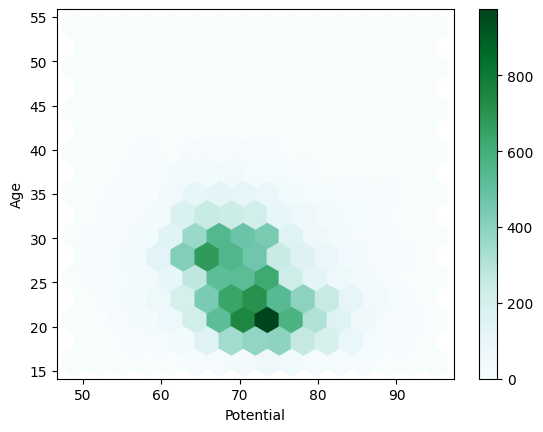

In [ ]:
df1.plot.hexbin(x='Potential', y='Age', gridsize=15, sharex=False)

In [ ]:
fig = px.scatter(df1, x='Age', y='ValueEUR', title='Relación entre Age y ValueEUR')
fig.update_xaxes(title='Age')
fig.update_yaxes(title='ValueEUR')

# Mostrar el gráfico
fig.show()


INSIGHT 2: El factor edad es un dato interesante a la hora de realizar una compra de un jugador. Se observa en el heatmap que pareciera que existe una fuerte correlacion entre edad y potencia. Sin embargo, no vemos relacion entre edad y el precio del jugador.

In [ ]:
import plotly.express as px

# Boxplot comparativo crecimiento vs edad
fig1 = px.box(df1, x='Growth', y='Age', title='Boxplot comparativo crecimiento vs edad')
fig1.update_xaxes(title='Crecimiento')
fig1.update_yaxes(title='Edad')
# Mostrar los gráficos
fig1.show()

INSIGHT 3: Analizamos que la variable mas correlacionada a la edad del jugador es el crecimiento, seguramente se deba a lo anteriormente mencionado: a mas edad menos perspectiva a futuro de la carrera profesional de jugador. Este gráfico resulta interesante para tener la edad en el que sería oportuna realizar una compra que me genere crecimiento a futuro.

In [ ]:
df1.groupby('BestPosition')['ValueEUR'].describe()

,count,mean,std,min,25%,50%,75%,max
BestPosition,,,,,,,,
CAM,2326.0,3.714368e+06,9.023374e+06,35000.0,550000.0,1150000.0,2600000.0,116500000.0
CB,3725.0,2.435079e+06,6.283656e+06,15000.0,475000.0,875000.0,1800000.0,102500000.0
CDM,1496.0,2.839729e+06,7.079557e+06,15000.0,550000.0,1100000.0,2200000.0,108000000.0
CF,65.0,8.329154e+06,1.469770e+07,150000.0,975000.0,1600000.0,6000000.0,66000000.0
CM,1062.0,4.819181e+06,1.103140e+07,50000.0,725000.0,1400000.0,3375000.0,125500000.0
GK,2119.0,1.930830e+06,6.673923e+06,9000.0,250000.0,525000.0,1200000.0,119500000.0
LB,1030.0,2.389282e+06,5.837948e+06,45000.0,475000.0,925000.0,1800000.0,83500000.0
LM,856.0,2.766449e+06,7.500038e+06,70000.0,575000.0,1000000.0,1900000.0,104000000.0
LW,182.0,5.645357e+06,1.690956e+07,200000.0,706250.0,1200000.0,2300000.0,129000000.0


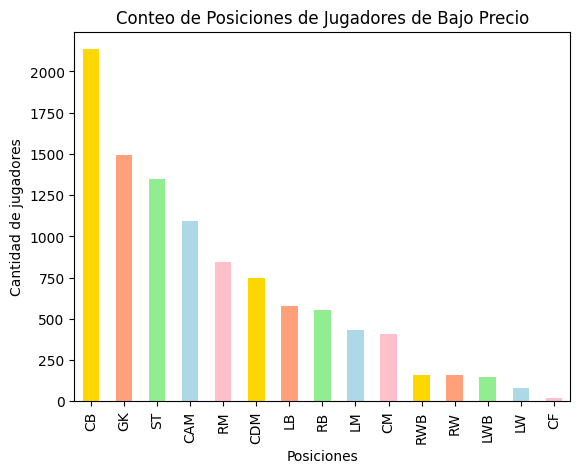

In [ ]:
import matplotlib.pyplot as plt

# Paleta de colores pastel
paleta_colores_pastel = ['#FFD700', '#FFA07A', '#90EE90', '#ADD8E6', '#FFC0CB']

# Filtrar jugadores de bajo precio
jugadores_bajo_precio = df1[df1['ValueEUR'] <= 1000000]

# Contar la cantidad de jugadores por posición
conteo_posiciones = jugadores_bajo_precio['BestPosition'].value_counts()

# Crear una figura y ejes de Matplotlib
fig, ax = plt.subplots()

# Crear un gráfico de barras con la paleta de colores pastel
conteo_posiciones.plot(kind='bar', color=paleta_colores_pastel)

# Personalizar los ejes y el título
ax.set_xlabel('Posiciones')
ax.set_ylabel('Cantidad de jugadores')
ax.set_title('Conteo de Posiciones de Jugadores de Bajo Precio')

# Mostrar el gráfico
plt.show()


In [ ]:
promising_players = df[(df.Growth > 4) & (df.Potential > 84)].sort_values(by='Potential', ascending=False)
print(f'Players find: {promising_players.shape[0]}')

Players find: 207


In [ ]:
promising_players[['Name', 'Age', 'Overall', 'Potential', 'BestPosition', 'ValueEUR', 'ReleaseClause']
].head(20).style.background_gradient(cmap='plasma')


,Name,Age,Overall,Potential,BestPosition,ValueEUR,ReleaseClause
26,E. Haaland,20,88,93,ST,137500000,244100000
42,T. Alexander-Arnold,22,87,92,RB,114000000,219500000
102,P. Foden,21,84,92,CAM,94500000,193700000
117,K. Havertz,22,84,92,CAM,94500000,193700000
41,F. de Jong,24,87,92,CM,119500000,253900000
175,F. Chiesa,23,83,91,CAM,80500000,0
289,Pedri,18,81,91,CAM,54000000,121500000
173,João Félix,21,83,91,CAM,82000000,184500000
1415,Ansu Fati,18,76,90,LW,17500000,46800000
235,D. Upamecano,22,82,90,CB,64000000,118400000


INSIGHT 4: A la hora de realizar una compra de un jugador, es necesario reforzar las posiciones más debiles del equipo, es por eso que se analizo para los jugadores de precio más accedible , cual es la disponibilidad de posiciones. Como se puede observar hay posiciones más enriquecidas que otras , sin embargo, todas las posiciones estan cubiertas. Analizamos las medidas de los valores medios de precio de cada una de las posiciones como también cuales jugadores son los referentes de mayor potencial.

In [ ]:
#Análisis de numérica vs. Categórica:
df1.groupby('Nationality')['ValueEUR'].mean()
df1.groupby('Nationality')['ValueEUR'].describe()

,count,mean,std,min,25%,50%,75%,max
Nationality,,,,,,,,
Afghanistan,1.0,8.750000e+05,NaN,875000.0,875000.0,875000.0,875000.0,875000.0
Albania,47.0,2.642660e+06,4.133822e+06,180000.0,525000.0,1200000.0,2250000.0,21000000.0
Algeria,52.0,5.984038e+06,1.072434e+07,210000.0,943750.0,1900000.0,6250000.0,65500000.0
Andorra,1.0,4.000000e+05,NaN,400000.0,400000.0,400000.0,400000.0,400000.0
Angola,17.0,2.516176e+06,2.914725e+06,275000.0,1100000.0,1800000.0,2600000.0,12500000.0
...,...,...,...,...,...,...,...,...
Venezuela,211.0,1.302536e+06,3.010738e+06,60000.0,425000.0,625000.0,1100000.0,26000000.0
Vietnam,1.0,5.250000e+05,NaN,525000.0,525000.0,525000.0,525000.0,525000.0
Wales,133.0,1.685752e+06,3.509977e+06,110000.0,375000.0,725000.0,1300000.0,25000000.0


In [ ]:
import pandas as pd
import plotly.express as px

# Categorización de 'potenciacateg'
df1['potenciacateg'] = df1['Potential'].apply(lambda x: 'High' if x > df1['Potential'].mean() else 'Low')

# Categorización de 'creccateg'
df1['creccateg'] = df1['Growth'].apply(lambda x: 'High' if x > df1['Growth'].mean() else 'Low')

# Categorización de 'preciocateg'
df1['preciocateg'] = df1['ValueEUR'].apply(lambda x: 'High' if x > df1['ValueEUR'].mean() else 'Low')

# Filtrado de datos según categorías
df1_potencia_alta = df1[df1['potenciacateg'] == 'High']
df1_crec_alto = df1[df1['creccateg'] == 'High']
df1_precio_alto = df1[df1['preciocateg'] == 'High']
df1_precio_bajo = df1[df1['preciocateg'] == 'Low']

# Cálculo de las 10 principales nacionalidades para cada categoría
top_10_nacionalidadesp = df1_potencia_alta['Nationality'].value_counts().head(10)
top_10_nacionalidadesc = df1_crec_alto['Nationality'].value_counts().head(10)
top_10_nacionalidadespa = df1_precio_alto['Nationality'].value_counts().head(10)
top_10_nacionalidadespb = df1_precio_bajo['Nationality'].value_counts().head(10)

# Creación de figuras interactivas con Plotly Express
fig1 = px.bar(top_10_nacionalidadesp, x=top_10_nacionalidadesp.index, y=top_10_nacionalidadesp.values,
              labels={'x': 'Nacionalidad', 'y': 'Recuento'},
              title='Top 10 Nacionalidades con jugadores con alta potencia')

fig2 = px.bar(top_10_nacionalidadesc, x=top_10_nacionalidadesc.index, y=top_10_nacionalidadesc.values,
              labels={'x': 'Nacionalidad', 'y': 'Recuento'},
              title='Top 10 Nacionalidades con jugadores de alto crecimiento')

fig3 = px.bar(top_10_nacionalidadespa, x=top_10_nacionalidadespa.index, y=top_10_nacionalidadespa.values,
              labels={'x': 'Nacionalidad', 'y': 'Recuento'},
              title='Top 10 Nacionalidades con jugadores de alto precio')

fig4 = px.bar(top_10_nacionalidadespb, x=top_10_nacionalidadespb.index, y=top_10_nacionalidadespb.values,
              labels={'x': 'Nacionalidad', 'y': 'Recuento'},
              title='Top 10 Nacionalidades con jugadores de bajo precio')

# Mostrar las figuras interactivas
fig1.show()
fig2.show()
fig3.show()
fig4.show()


In [ ]:
print('Maximum Potential : '+str(df1.loc[df['Potential'].idxmax()][1]))
print('Maximum Overall Perforamnce : '+str(df1.loc[df['Overall'].idxmax()][1]))
print('Maximum Price : '+str(df.loc[df1['ValueEUR'].idxmax()][1]))

Maximum Potential : K. Mbappé
Maximum Overall Perforamnce : L. Messi
Maximum Price : K. Mbappé


INSIGHT 5: Se analizó las nacionalidades de os jugadores segun precio y potencia. Es importante destacar que jugadores con alta potencia tambien tienen alto valor de compra: por ejemplo: K. Mbappé. Es sumamente importante a la hora de realizar la negociación tener en cuenta esto y segun la disponibilidad económica tomar una decisión.

In [ ]:

# Tabla de contingencia normalizada
tabla_contingencia = pd.crosstab(df1['BestPosition'], df1['Nationality'], normalize=True)

# Crear el heatmap con Plotly Express
fig = px.imshow(tabla_contingencia.values,
                x=tabla_contingencia.columns,
                y=tabla_contingencia.index,
                color_continuous_scale='viridis',  # Cambiar a la paleta de colores deseada
                labels={'x': 'Nationality', 'y': 'BestPosition'},
                title='Heatmap de BestPosition vs Nationality (Tabla Normalizada)')

# Mostrar el heatmap
fig.show()


INSIGHT 6 :  Al parecer las variables Best Position y Nationality no estan relacionadas fuertemente.

# EDA. Analisis multivariado



Best in ST


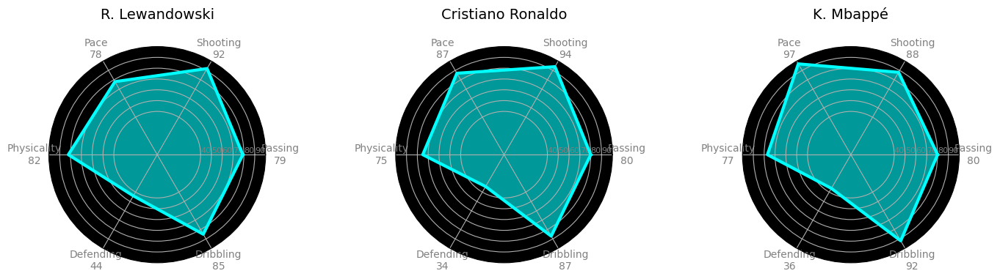



Best in CF


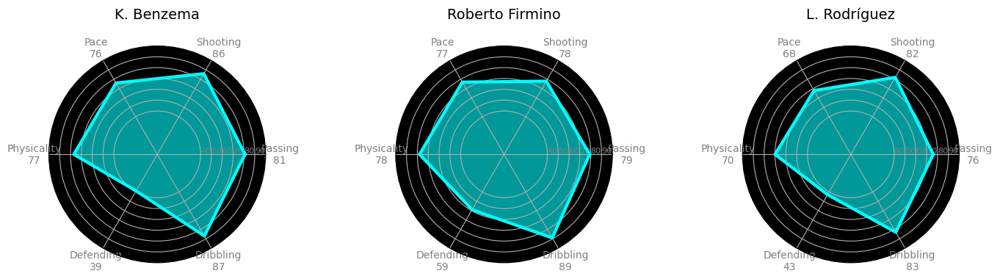



Best in RF


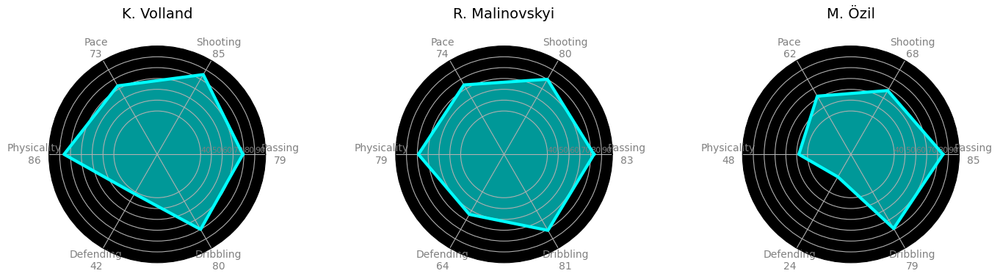



Best in LF


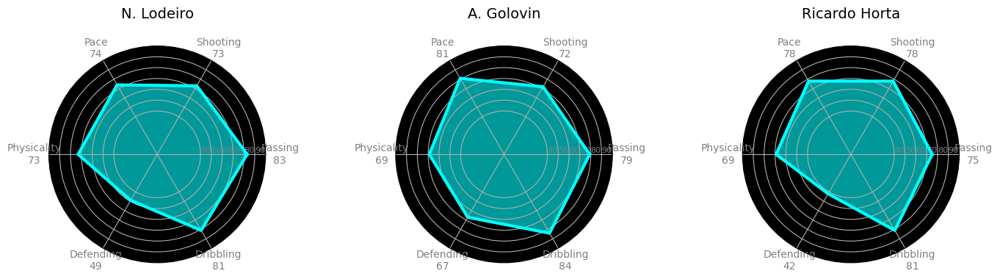



Best in RW


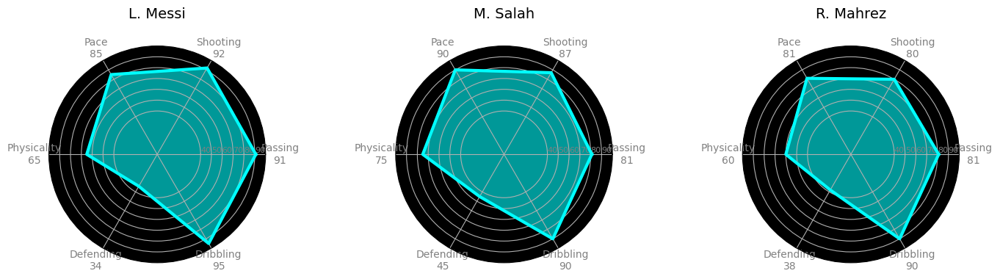



Best in LW


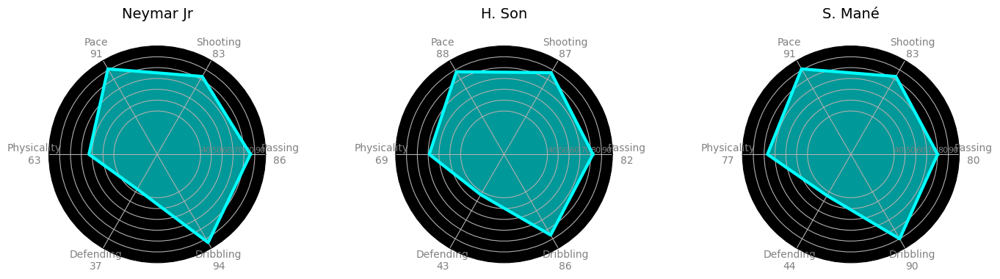



Best in LM


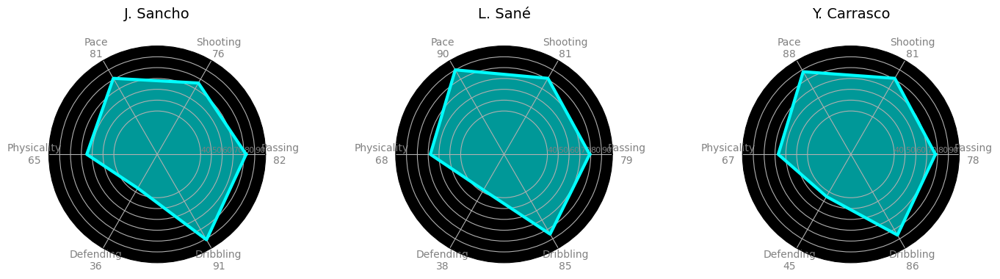



Best in RM


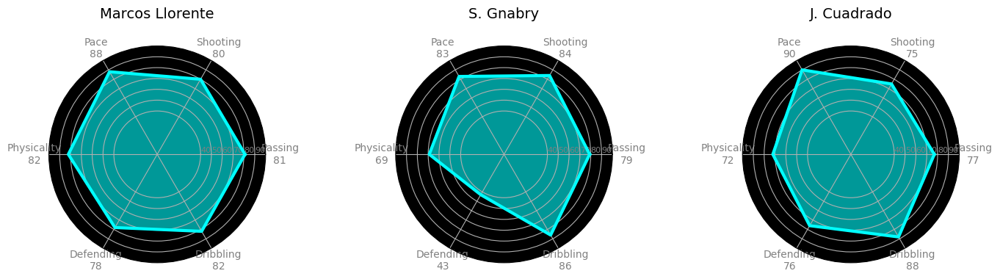



Best in CAM


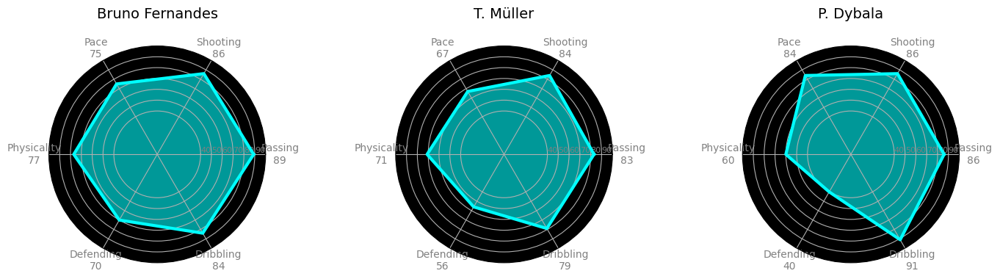



Best in CM


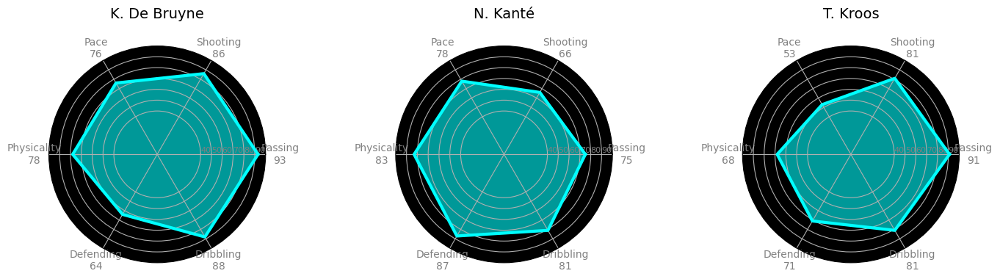



Best in CDM


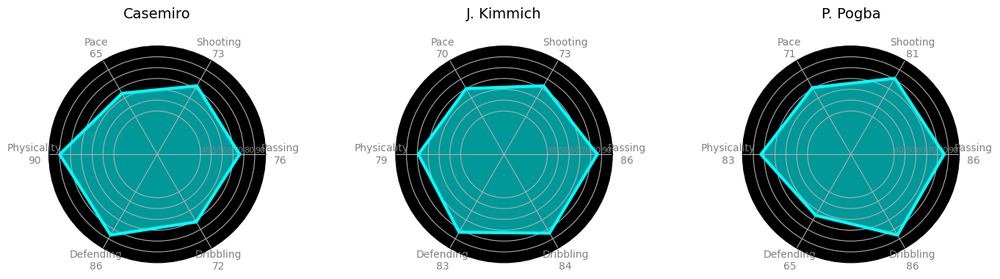



Best in RB


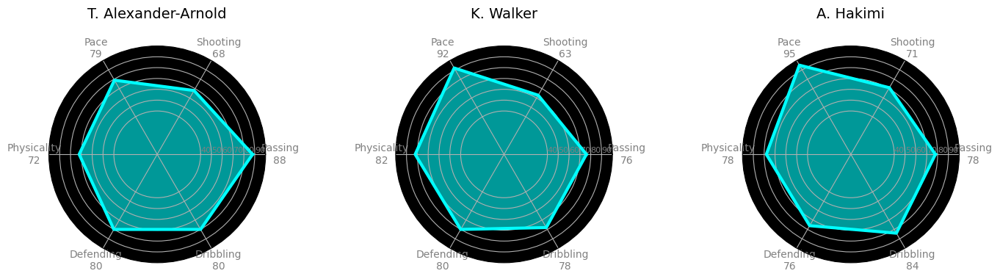



Best in LB


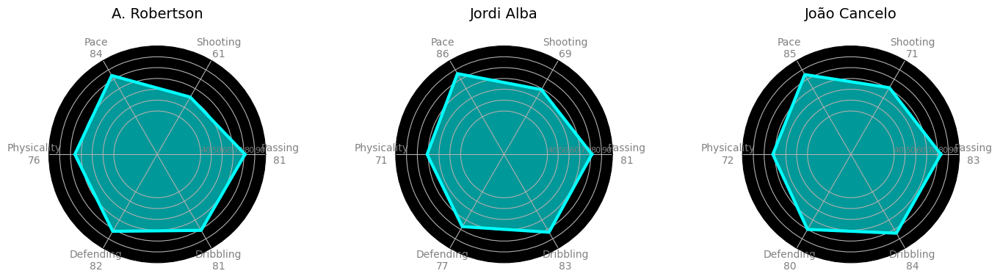



Best in CB


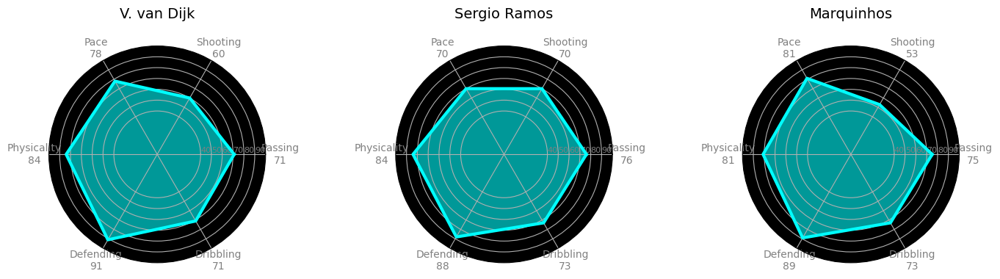



Best in RWB


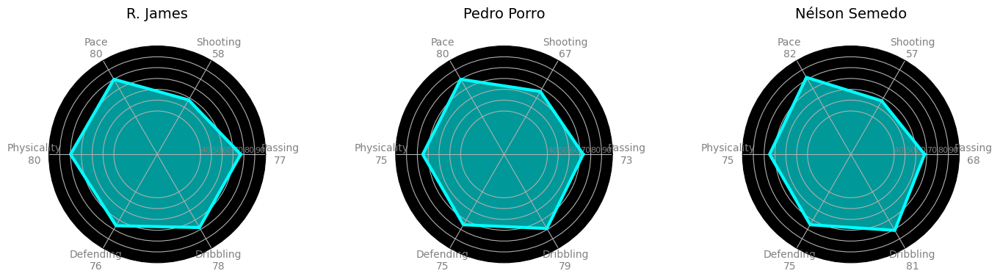



Best in LWB


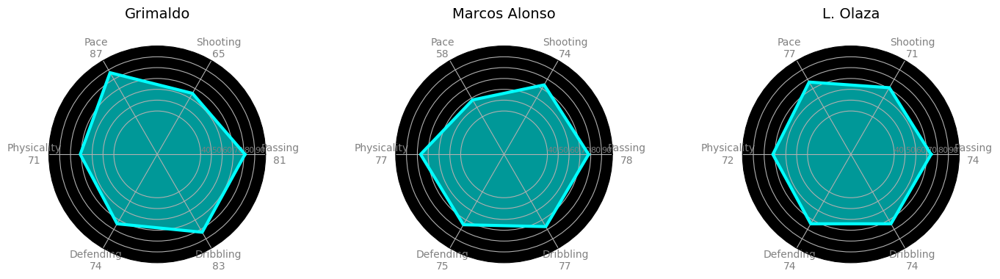



Best in GK


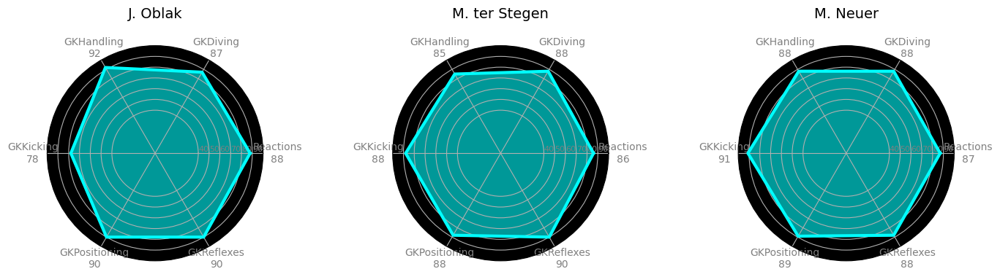

In [ ]:
from math import pi

def make_spider(row, i):
    # Create Radar chart
    categories=['PassingTotal', 'ShootingTotal', 'PaceTotal',
                'PhysicalityTotal',  'DefendingTotal', 'DribblingTotal']
    if row[1].BestPosition == "GK":
        categories=['Reactions', 'GKDiving', 'GKHandling',
                    'GKKicking', 'GKPositioning', 'GKReflexes']
    N = len(categories)
    angles = [n / float(N) * 2 * pi for n in range(N)]
    angles += angles[:1]
    ax = plt.subplot(1, 3, i + 1, polar=True)
    plt.subplots_adjust(wspace=0.6)
    xticks_names =  [f"{cat.replace('Total', '')}\n{row[1][cat]}" for cat in categories]
    plt.xticks(angles[:-1], xticks_names, color='grey', size=10)

    ax.set_rlabel_position(0)
    ax.set_facecolor('xkcd:black')
    plt.yticks([40, 50, 60, 70, 80, 90],
               ["40", "50", "60","70","80","90"],
               color="grey", size=8)
    plt.ylim(0,100)
    values=row[1][categories].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color='cyan', linewidth=3, linestyle='solid')
    ax.fill(angles, values, color='cyan', alpha=0.6)

    plt.title(row[1].Name, size=14, color='black', y=1.1)

positions = ['ST', 'CF', 'RF', 'LF', 'RW', 'LW', 'LM', 'RM',
             'CAM', 'CM', 'CDM', 'RB', 'LB', 'CB', 'RWB', 'LWB', 'GK']
bar_kwargs = dict(x='Name', y='Overall', figsize=(16,4), yticks=list(range(0, 100, 10)), rot=0)

for pos in positions:
    print(f'\n\nBest in {pos}')
    plt.figure(figsize=(16,16))
    for i, row in enumerate(df[df.ClubPosition==pos][:3].iterrows()):
        make_spider(row, i)
    plt.show()

In [ ]:
# Filtrar valores de ValueEUR menores a 1M
df_filtered = df1[df1['ValueEUR'] < 1000000]

In [ ]:
import pandas as pd
import plotly.express as px
# Crear el gráfico con Plotly Express
fig = px.scatter(df_filtered, x='ValueEUR', y='Nationality', color='BestPosition', height=600,
                 hover_name='FullName', hover_data=['BestPosition'])

fig.update_traces(texttemplate='%{hovertext}', hoverinfo='text+name')

fig.update_layout(
    title='Scatterplot de BestPosition vs ValueEUR por Nationality (Filtrado)',
    showlegend=False
)

# Mostrar el gráfico
fig.show()


In [ ]:
pr_cols=['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys',
       'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl',
       'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance',
       'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
       'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties',
       'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving',
       'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']
print('BEST IN DIFFERENT ASPECTS :')
print('_________________________\n\n')
i=0
while i < len(pr_cols):
    print('Best {0} : {1}'.format(pr_cols[i],df1.loc[df1[pr_cols[i]].idxmax()][1]))
    i += 1

BEST IN DIFFERENT ASPECTS :
_________________________


Best Crossing : K. De Bruyne
Best Finishing : L. Messi
Best HeadingAccuracy : L. de Jong
Best ShortPassing : K. De Bruyne
Best Volleys : L. Suárez
Best Dribbling : L. Messi
Best Curve : Quaresma
Best FKAccuracy : L. Messi
Best LongPassing : K. De Bruyne
Best BallControl : L. Messi
Best Acceleration : K. Mbappé
Best SprintSpeed : K. Mbappé
Best Agility : Neymar Jr
Best Reactions : L. Messi
Best Balance : R. Fraser
Best ShotPower : A. Kolarov
Best Jumping : Cristiano Ronaldo
Best Stamina : N. Kanté
Best Strength : A. Akinfenwa
Best LongShots : L. Messi
Best Aggression : B. Pearson
Best Interceptions : N. Kanté
Best Positioning : T. Müller
Best Vision : L. Messi
Best Penalties : Neymar Jr
Best Composure : L. Messi
Best Marking : G. Chiellini
Best StandingTackle : N. Kanté
Best SlidingTackle : A. Wan-Bissaka
Best GKDiving : G. Donnarumma
Best GKHandling : J. Oblak
Best GKKicking : Ederson
Best GKPositioning : S. Handanovič
Best GKRefl

INSIGHT 7: Para el análisis multivariable, se hizo una caracterización general de los jugadores según sus caracteristicas deportivas, como también se realizo un gráfico de los jugadores más económicos, para tener en cuenta en futuras decisiones.

# CONCLUSION GENERAL: Analizamos en el trabajo, variables que esten relacionadas con el precio y la potencia de un jugador para poder tener en cuenta esa información a la hora de generar un negocio, obtuvimos como resultado que de las variables que mas afectan el precio de venta de un jugador se encuentra la reputación, el puntaje deportivo general y la potencia futuro del mismo. Analizamos en particular que la edad no es una variable relacionada con el precio, sino mas bien con otra variable crecimiento, que nos ayuda a visualizar que tanto puede crecer un jugador a futuro en cuanto a potencia deportiva. Por ultimo tuvimos en cuenta que hay posiciones mas caras de por si, y que hay paises que probablemente por la incidencia del futbol en ellos, tienen mayor cantidad de jugadores disponibles.



# Algoritmo de machine learning

In [ ]:
import pandas as pd

# Calcular la matriz de correlación
corr_matrix = df1.corr()

# Seleccionar la columna de correlaciones con 'ValueEUR'
ValueEUR_correlations_correlations1= corr_matrix['ValueEUR'].abs().sort_values(ascending=False)
variables_correlated_with_ValueEUR1=ValueEUR_correlations_correlations1.index[1:]
print("Variables correlacionadas con 'ValueEUR'(de mayor a menor):")
print(variables_correlated_with_ValueEUR1)

<ipython-input-60-3c7b91839b80>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



Variables correlacionadas con 'ValueEUR'(de mayor a menor):
Index(['ReleaseClause', 'WageEUR', 'IntReputation', 'Overall', 'Potential',
       'Reactions', 'BaseStats', 'PassingTotal', 'DribblingTotal', 'Composure',
       'TotalStats', 'Vision', 'CMRating', 'CAMRating', 'ShotPower',
       'ShortPassing', 'LMRating', 'RMRating', 'STRating', 'LFRating',
       'CFRating', 'RFRating', 'LWRating', 'RWRating', 'ShootingTotal',
       'LongPassing', 'BallControl', 'SkillMoves', 'CDMRating', 'Curve',
       'RWBRating', 'LWBRating', 'Dribbling', 'Volleys', 'PhysicalityTotal',
       'LongShots', 'RBRating', 'LBRating', 'Crossing', 'Positioning',
       'ContractUntil', 'Finishing', 'FKAccuracy', 'PaceTotal', 'Stamina',
       'CBRating', 'Penalties', 'Aggression', 'Agility', 'HeadingAccuracy',
       'SprintSpeed', 'Acceleration', 'DefendingTotal', 'WeakFoot',
       'ClubJoined', 'Interceptions', 'Marking', 'Strength', 'ID',
       'StandingTackle', 'Jumping', 'Balance', 'Growth', 'Sliding

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Separar las características (X) y la variable objetivo (y)
X = df1[['IntReputation', 'Overall', 'Potential',
       'Reactions', 'BaseStats', 'PassingTotal','TotalStats','ShotPower', 'ShootingTotal','BallControl','SkillMoves'
      ]]
y = df1['ValueEUR']
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Crear el modelo de regresión lineal
model = LinearRegression()

# Entrenar el modelo con los datos de entrenamiento
model.fit(X_train, y_train)

# Hacer predicciones en el conjunto de prueba
y_pred = model.predict(X_test)

# Evaluar el rendimiento del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Error cuadrático medio (MSE):", mse)
print("Coeficiente de determinación (R^2):", r2)



Error cuadrático medio (MSE): 33561734270746.316
Coeficiente de determinación (R^2): 0.5056904472379973


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear un diccionario para almacenar las métricas
metrics = {}

# Regresión Lineal
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
mse_lr = mean_squared_error(y_test, y_pred_lr)
rmse_lr = np.sqrt(mse_lr)
mae_lr = mean_absolute_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)
metrics['Regresión Lineal'] = {'MSE': mse_lr, 'RMSE': rmse_lr, 'MAE': mae_lr, 'R^2': r2_lr}

# Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mse_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
metrics['Random Forest'] = {'MSE': mse_rf, 'RMSE': rmse_rf, 'MAE': mae_rf, 'R^2': r2_rf}

# Máquinas de Vectores de Soporte (SVM) Regresión
svm = SVR(kernel='linear')
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)
mse_svm = mean_squared_error(y_test, y_pred_svm)
rmse_svm = np.sqrt(mse_svm)
mae_svm = mean_absolute_error(y_test, y_pred_svm)
r2_svm = r2_score(y_test, y_pred_svm)
metrics['SVM Regresión'] = {'MSE': mse_svm, 'RMSE': rmse_svm, 'MAE': mae_svm, 'R^2': r2_svm}

# K-Nearest Neighbors (KNN) Regresión
knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
mse_knn = mean_squared_error(y_test, y_pred_knn)
rmse_knn = np.sqrt(mse_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)
metrics['KNN Regresión'] = {'MSE': mse_knn, 'RMSE': rmse_knn, 'MAE': mae_knn, 'R^2': r2_knn}

# Árbol de Decisión Regresión
tree = DecisionTreeRegressor(random_state=42)
tree.fit(X_train, y_train)
y_pred_tree = tree.predict(X_test)
mse_tree = mean_squared_error(y_test, y_pred_tree)
rmse_tree = np.sqrt(mse_tree)
mae_tree = mean_absolute_error(y_test, y_pred_tree)
r2_tree = r2_score(y_test, y_pred_tree)
metrics['Árbol de Decisión'] = {'MSE': mse_tree, 'RMSE': rmse_tree, 'MAE': mae_tree, 'R^2': r2_tree}

# Imprimir métricas
for model, metric_dict in metrics.items():
    print(f"{model} Metrics:")
    for metric_name, metric_value in metric_dict.items():
        print(f"{metric_name}: {metric_value}")
    print()



Regresión Lineal Metrics:
MSE: 34334381454092.484
RMSE: 5859554.714659851
MAE: 2309651.2775469837
R^2: 0.5129969671154546

Random Forest Metrics:
MSE: 5098931672525.649
RMSE: 2258081.4140605405
MAE: 365579.54286012525
R^2: 0.9276761344219564

SVM Regresión Metrics:
MSE: 66457063853538.48
RMSE: 8152120.20602852
MAE: 1956081.0527148296
R^2: 0.05736494200283859

KNN Regresión Metrics:
MSE: 20692844973964.51
RMSE: 4548938.884395405
MAE: 980639.4561586638
R^2: 0.7064901758954142

Árbol de Decisión Metrics:
MSE: 9513128603862.217
RMSE: 3084336.0069652298
MAE: 452061.84629436326
R^2: 0.8650646295027575



Como podemos observar comparando distintos modelos de regresion vemos que el random forest es el que devuelve mejores valores de metricas:Un RMSE y MAE más bajos, junto con un R^2 más cercano a 1, indican un mejor rendimiento del modelo en la predicción de valores numéricos.

# Crossvalidation:

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier

# Now, you can create an instance of the RandomForestClassifier
rf_classifier = RandomForestClassifier()


mse_scores = cross_val_score(rf_classifier, X, y, cv=5, scoring='neg_mean_squared_error')

# Nota: Usamos 'neg_mean_squared_error' para que los resultados sean negativos y más grandes sea mejor

# Convierte los resultados negativos en positivos (si lo deseas)
mse_scores = -mse_scores

# Imprimir los MSE de cada pliegue
print("MSE Scores:", mse_scores)

# Calcular el MSE promedio y la desviación estándar
mse_mean = mse_scores.mean()
mse_std = mse_scores.std()

print("MSE Promedio:", mse_mean)
print("Desviación Estándar del MSE:", mse_std)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_split.py:700: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.



MSE Scores: [2.61228292e+13 7.09509954e+12 1.00294618e+13 1.09131562e+13
 6.72922144e+12]
MSE Promedio: 12177953627530.652
Desviación Estándar del MSE: 7158203303347.082


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Crear un modelo de regresión RandomForestRegressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)

# Realizar validación cruzada y calcular los R^2 scores
r2_scores = cross_val_score(rf_regressor, X, y, cv=5, scoring='r2')

# Imprimir los R^2 scores de cada pliegue
print("R^2 Scores:", r2_scores)

# Calcular el R^2 promedio y la desviación estándar
r2_mean = r2_scores.mean()
r2_std = r2_scores.std()

print("R^2 Promedio:", r2_mean)
print("Desviación Estándar de R^2:", r2_std)


R^2 Scores: [-0.16401673  0.83191349  0.87252034  0.70749037 -0.01586484]
R^2 Promedio: 0.4464085255918989
Desviación Estándar de R^2: 0.443771280145424


Se realizó la validación cruzada y observamos que no es alto el valor de R cuadrado: R^2 Promedio: 0.4464085255918989 . Es por esto que se podría mejorar el modelo con una mejora de hiperparámetros o hipertunning  o con bagging ya que el random forest es un modelo que tiende a el sobreajuste, ambas podrian ser las razones por las cuales cuando realizamos una validación cruzada no obtenemos buenos resultados.



# Hipertunning

In [ ]:
#Hypertuning utilizando grid search
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

random_forest = RandomForestRegressor()

params = {'n_estimators' : [100, 200, 500],'max_features': [2,3]
}

grid_random_forest = GridSearchCV(estimator = random_forest,
 param_grid = params,
 scoring = 'neg_mean_absolute_error',cv = 5, verbose = 1,n_jobs = -1) # corrida en paralelo

In [ ]:
#Entrenamos el modelo
grid_random_forest.fit(X_train, y_train)
#Obtenemos el mejor modelo!
grid_random_forest.best_estimator_


Fitting 5 folds for each of 6 candidates, totalling 30 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



RandomForestRegressor(max_features=3, n_estimators=500)

In [ ]:
best_model = grid_random_forest.best_estimator_
y_pred = best_model.predict(X_test)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# Hacer predicciones en el conjunto de datos de prueba
y_pred = best_model.predict(X_test)

# Calcular el Error Cuadrado Medio (MSE)
mse = mean_squared_error(y_test, y_pred)

# Calcular el Coeficiente de Determinación (R^2)
r2 = r2_score(y_test, y_pred)

print(f'MSE: {mse}')
print(f'R^2: {r2}')


MSE: 6437477282153.362
R^2: 0.9086900410678473


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Realizar validación cruzada y calcular los R^2 scores
r2_scorescontunning = cross_val_score(best_model, X, y, cv=5, scoring='r2')



In [ ]:
# Imprimir los R^2 scores de cada pliegue
print("R^2 Scores:", r2_scorescontunning)

# Calcular el R^2 promedio y la desviación estándar
r2_mean2 = r2_scorescontunning.mean()
r2_std2 = r2_scorescontunning.std()

print(r2_mean2,r2_std2)

R^2 Scores: [-0.22028487  0.79470286  0.84970073  0.71348929 -0.52941021]
0.32163955960333146 0.578645225135847


In [ ]:
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Crear un Bagging Regressor que utiliza el Random Forest como estimador base
bagging_regressor = BaggingRegressor(base_estimator=best_model)

# Entrenar el modelo Bagging en el conjunto de entrenamiento
bagging_regressor.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba
y_pred_bagging = bagging_regressor.predict(X_test)

# Calcular el Error Cuadrático Medio (MSE) y el Coeficiente de Determinación (R^2)
mse_bagging = mean_squared_error(y_test, y_pred_bagging)
r2_bagging = r2_score(y_test, y_pred_bagging)

print(f'MSE del modelo Bagging: {mse_bagging}')
print(f'R^2 del modelo Bagging: {r2_bagging}')


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



MSE del modelo Bagging: 6645139136474.549
R^2 del modelo Bagging: 0.9057445401272213


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor

# Realizar validación cruzada y calcular los R^2 scores
r2_scoresconbagging= cross_val_score(bagging_regressor, X, y, cv=5, scoring='r2')

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



In [ ]:
# Imprimir los R^2 scores de cada pliegue
print("R^2 Scores:", r2_scoresconbagging)

# Calcular el R^2 promedio y la desviación estándar
r2_meanbagging = r2_scoresconbagging.mean()
r2_stdbagging= r2_scoresconbagging.std()

print(r2_meanbagging,r2_stdbagging)

R^2 Scores: [-0.22160304  0.7922956   0.84593077  0.70648315 -0.68782509]
0.2870562758898988 0.6249246932179178


Observamos que luego de las mejoras planteadas de hippertunning y bagging, volvemos a realizar una validacion cruzada y se mejora el modelo, sin embargo parece que sigue habiendo algo de sobreajuste.

# Encoding

In [ ]:
import pandas as pd
# Obtener información sobre los tipos de datos de las columnas para conocer los tipos de datos que tiene cada una
column_info = {
    'columna': [],
    'tipo': []
}

for columna in df1.columns:
    column_info['columna'].append(columna)
    column_info['tipo'].append(str(df1[columna].dtype))

info_df = pd.DataFrame(column_info)

# Filtrar columnas por tipo
columnas_numericas = info_df[info_df['tipo'].isin(['int64', 'float64'])]['columna']
columnas_string = info_df[info_df['tipo'] == 'object']['columna']
columnas_booleanas = info_df[info_df['tipo'] == 'bool']['columna']

print("Columnas numéricas:", columnas_numericas.tolist())
print("Columnas string:", columnas_string.tolist())
print("Columnas booleanas:", columnas_booleanas.tolist())

Columnas numéricas: ['ID', 'Age', 'Height', 'Weight', 'Overall', 'Potential', 'Growth', 'TotalStats', 'BaseStats', 'ValueEUR', 'WageEUR', 'ReleaseClause', 'ContractUntil', 'ClubNumber', 'ClubJoined', 'NationalNumber', 'IntReputation', 'WeakFoot', 'SkillMoves', 'PaceTotal', 'ShootingTotal', 'PassingTotal', 'DribblingTotal', 'DefendingTotal', 'PhysicalityTotal', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes', 'STRating', 'LWRating', 'LFRating', 'CFRating', 'RFRating', 'RWRating', 'CAMRating', 'LMRating', 'CMRating', 'RMRating', 'LWBRating', 'CDMRating', 'RWBRating', 'LBRating', 'CBR

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Crear una instancia del LabelEncoder
le = LabelEncoder()

df1['Nationality'] = le.fit_transform(df1['Nationality'])
df1['BestPosition'] = le.fit_transform(df1['BestPosition'])
df1['PreferredFoot'] = le.fit_transform(df1['PreferredFoot'])
df1['AttackingWorkRate'] = le.fit_transform(df1['AttackingWorkRate'])
df1['DefensiveWorkRate'] = le.fit_transform(df1['DefensiveWorkRate'])

In [ ]:
columnas_a_eliminar = ['ID', 'ContractUntil', 'ClubJoined','NationalNumber','WeakFoot','Name','FullName','PhotoUrl','Positions', 'Club', 'ClubPosition', 'NationalTeam', 'NationalPosition','ClubNumber']
df1 = df1.drop(columnas_a_eliminar, axis=1)
print(df1)





       Age  Height  Weight  Nationality  Overall  Potential  Growth  \
0       34     170      72            6       93         93       0   
1       32     185      81          123       92         92       0   
2       36     187      83          124       91         91       0   
3       22     182      73           56       91         95       4   
4       28     188      87          137       91         93       2   
...    ...     ...     ...          ...      ...        ...     ...   
19255   19     180      75          126       48         62      14   
19256   23     196      85           30       48         52       4   
19257   20     183      77           30       48         55       7   
19258   20     174      69           30       48         58      10   
19259   22     186      70           30       48         53       5   

       TotalStats  BaseStats  BestPosition  ...  LMRating  CMRating  RMRating  \
0            2219        462            12  ...        93        9

In [ ]:
# Encontrar columnas con valores NaN
columns_with_nan = df1.columns[df1.isna().any()].tolist()

if len(columns_with_nan) > 0:
    print("Los valores NaN se encuentran en las siguientes columnas:")
    for column in columns_with_nan:
        print(column)
else:
    print("No hay valores NaN en ninguna columna del DataFrame df1.")


No hay valores NaN en ninguna columna del DataFrame df1.


In [ ]:
# Separar las características (X) y la variable objetivo (y)
X1 = df1
y1 = df1['ValueEUR']


In [ ]:
from sklearn.model_selection import train_test_split
# Dividir los datos en conjuntos de entrenamiento y prueba
X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size=0.3, random_state=42)

In [ ]:
print(y_test1)

13954       400000
18712       220000
344       26000000
1034      15500000
12445      1100000
           ...    
20       108000000
15649       160000
13460       925000
7479        850000
8458       1200000
Name: ValueEUR, Length: 5747, dtype: int64


# Machine learning: Random Forest.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
# Crear un modelo de Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=10, random_state=42)

# Entrenar el modelo en el conjunto de entrenamiento
rf_regressor.fit(X_train1, y_train1)

# Realizar predicciones en el conjunto de prueba
y_pred1 = rf_regressor.predict(X_test1)

# Calcular métricas de rendimiento
mse1 = mean_squared_error(y_test1, y_pred1)
r2_1 = r2_score(y_test1, y_pred1)

print(f'Mean Squared Error (MSE): {mse1:.2f}')
print(f'Coefficient of Determination (R^2): {r2_1:.2f}')


Mean Squared Error (MSE): 1376098411475.55
Coefficient of Determination (R^2): 0.98


# Cross-validation.

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
import numpy as np

# Crear un modelo de Random Forest Regressor
rf_regressor = RandomForestRegressor(n_estimators=10, random_state=42)

# Definir la métrica de evaluación, en este caso, el MSE y el R^2
scoring = {'MSE': make_scorer(mean_squared_error), 'R^2': make_scorer(r2_score)}

# Realizar la validación cruzada
mse_scoresA = cross_val_score(rf_regressor, X1, y1, cv=5, scoring=scoring['MSE'])
r2_scoresA= cross_val_score(rf_regressor, X1, y1, cv=5, scoring=scoring['R^2'])

# Calcular el promedio y la desviación estándar de las métricas
mse_meanA = np.mean(mse_scoresA)
mse_stdA = np.std(mse_scoresA)
r2_meanA = np.mean(r2_scoresA)
r2_stdA = np.std(r2_scoresA)

print(f'Cross-Validation MSE Mean: {mse_meanA:.2f}')
print(f'Cross-Validation MSE Standard Deviation: {mse_stdA:.2f}')
print(f'Cross-Validation R^2 Mean: {r2_meanA:.2f}')
print(f'Cross-Validation R^2 Standard Deviation: {r2_stdA:.2f}')


Cross-Validation MSE Mean: 49673163489206.85
Cross-Validation MSE Standard Deviation: 99346325966765.31
Cross-Validation R^2 Mean: 0.77
Cross-Validation R^2 Standard Deviation: 0.46


# Hippertuning o mejora de parametros

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

# Definir la cuadrícula de hiperparámetros a ajustar (puedes reducir el rango)
param_dist = {
    'n_estimators': [25,50],
    'max_depth': [None, 10],
    'min_samples_split': [2, 5]
}

# Realizar la búsqueda aleatoria de hiperparámetros optimizando el R^2
random_search = RandomizedSearchCV(rf_regressor, param_distributions=param_dist, n_iter=5, scoring='r2', cv=5)
random_search.fit(X1, y1)

# Obtener el mejor modelo y sus hiperparámetros
best_rf_regressor2 = random_search.best_estimator_
best_params = random_search.best_params_

# Entrenar el mejor modelo en el conjunto de datos completo
best_rf_regressor2.fit(X1, y1)

# Realizar predicciones con el mejor modelo
y_pred = best_rf_regressor2.predict(X1)

# Calcular métricas de rendimiento
r2 = best_rf_regressor2.score(X1, y1)
print("Mejores hiperparámetros:", best_params)
print(f"Coeficiente de Determinación (R^2): {r2:.2f}")




Mejores hiperparámetros: {'n_estimators': 50, 'min_samples_split': 2, 'max_depth': None}
Coeficiente de Determinación (R^2): 1.00


# Bagging

In [ ]:
    bagging_regressor2 = BaggingRegressor(base_estimator=best_rf_regressor2)
    bagging_regressor2.fit(X1, y1)
    y_pred_bagging2 = bagging_regressor2.predict(X1)
    mse_bagging2 = mean_squared_error(y1, y_pred_bagging2)
    r2_bagging2 = r2_score(y1, y_pred_bagging2)
    print(f'MSE del modelo Bagging: {mse_bagging2}')
    print(f'R^2 del modelo Bagging: {r2_bagging2}')

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.



MSE del modelo Bagging: 72514140732.69159
R^2 del modelo Bagging: 0.9987473246221802


# Cross- validation final:

In [ ]:
# Definir la métrica de evaluación, en este caso, el MSE y el R^2
scoringfinal = {'MSE': make_scorer(mean_squared_error), 'R^2': make_scorer(r2_score)}

# Realizar la validación cruzada
mse_scoresfinal = cross_val_score(bagging_regressor2, X1, y1, cv=5, scoring=scoringfinal['MSE'])
r2_scoresfinal = cross_val_score(bagging_regressor2, X1, y1, cv=5, scoring=scoringfinal['R^2'])

# Calcular el promedio y la desviación estándar de las métricas
mse_meanfinal = np.mean(mse_scoresfinal)
mse_stdfinal = np.std(mse_scoresfinal)
r2_meanfinal = np.mean(r2_scoresfinal)
r2_stdfinal = np.std(r2_scoresfinal)

print(f'Cross-Validation MSE Mean: {mse_meanfinal:.2f}')
print(f'Cross-Validation MSE Standard Deviation: {mse_stdfinal:.2f}')
print(f'Cross-Validation R^2 Mean: {r2_mean2:.2f}')
print(f'Cross-Validation R^2 Standard Deviation: {r2_stdfinal:.2f}')


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning:

`base_estimator` was renamed to `estim

Cross-Validation MSE Mean: 49717726909800.71
Cross-Validation MSE Standard Deviation: 99435452734735.75
Cross-Validation R^2 Mean: 0.32
Cross-Validation R^2 Standard Deviation: 0.46



En una segunda instancia del modelado con algoritmo con machine learning. A diferencia de la instancia previa en este caso vamos a incluir más variables en nuestro algoritmo y evaluaremos si esta estrategia mejora las métricas de nuestro modelo. Realizamos una separación de variables numéricas y categóricas y realizamos un label encoding de muchas variables categóricas que queríamos incluir en nuestro análisis. También eliminamos muchas otras que no consideramos que aporten a nuestro problema.

Luego realizamos una predicción del modelo utilizando random forest y observamos en principio una mejora del modelo con los siguientes valores de métricas:
Mean Squared Error (MSE): 1376098411475.55
Coefficient of Determination (R^2): 0.98 . El análisis de cross-validation de este modelo nos arroja un R^2 de 0.77 .

También realizamos un hipertunning y  bagging y  observamos que si bien mejora el R^2 , luego la crossvalidation no arroja tan buenos resultaodos como la estrategia anterior.


Es por estos resultados que determinamos que ésta segunda estrategia donde utilizamos mucha mas cantidad de variables nos sirve mucho más para describir el comportamiento de nuestros datos, y en esta estrategia utilizaremos la versión de prediccion sin necesidad de agregarle hipepertunning ni bagging, ya que nos ha arrojado mejores resultados, probablemente esto tenga que ver con que ya no se puede mejorar mas el modelo o porque tiende al sobreajuste.